In [1]:
import numpy as np
import pandas as pd
import cv2
import os
import warnings
import tqdm
import random
import matplotlib.pyplot as plt
from keras.preprocessing.image import load_img

In [2]:
input_path = []
label = []

# Path to the PetImages directory
base_dir = 'kagglecatsanddogs_5340 (1)/PetImages'

# Iterate over the directories (Cat, Dog) inside PetImages
for class_name in os.listdir(base_dir):
    class_path = os.path.join(base_dir, class_name)
    if os.path.isdir(class_path):  # Check if it's a directory
        for path in os.listdir(class_path):
            if class_name == 'Cat':
                label.append(0)
            elif class_name == 'Dog':
                label.append(1)
            input_path.append(os.path.join("PetImages", class_name, path))

print(input_path[0], label[0])
print(input_path[10], label[0])

PetImages/Cat/9733.jpg 0
PetImages/Cat/10447.jpg 0


In [3]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac = 1).reset_index(drop = True)
df.head(10)

,images,label
0,PetImages/Cat/1165.jpg,0
1,PetImages/Cat/6593.jpg,0
2,PetImages/Cat/1292.jpg,0
3,PetImages/Cat/11242.jpg,0
4,PetImages/Dog/12385.jpg,1
5,PetImages/Dog/6510.jpg,1
6,PetImages/Dog/8820.jpg,1
7,PetImages/Dog/6013.jpg,1
8,PetImages/Dog/6734.jpg,1
9,PetImages/Cat/10439.jpg,0


In [4]:
for i in df['images']:
    if '.jpg' not in i:
       print(i)
df = df[df['images'] != 'PetImages/Dog/Thumbs.db'] 
df = df[df['images'] != 'PetImages/Cat/Thumbs.db'] 

PetImages/Dog/Thumbs.db
PetImages/Cat/Thumbs.db


In [5]:
df.columns = df.columns.str.strip()
df.columns


Index(['images', 'label'], dtype='object')

In [6]:
import PIL
l =[]
for image in df['images']:
    try:
        img = PIL.Image.open('kagglecatsanddogs_5340 (1)/' + image)
    except:
        l.append(image)


/opt/anaconda3/lib/python3.12/site-packages/PIL/TiffImagePlugin.py:890: UserWarning: Truncated File Read
  warnings.warn(str(msg))


In [7]:
l

['PetImages/Dog/11702.jpg', 'PetImages/Cat/666.jpg']

In [8]:
#remove corrupted:
df = df[df['images'] != 'PetImages/Dog/11702.jpg'] 
df = df[df['images'] != 'PetImages/Cat/666.jpg'] 

In [9]:
dogs = df[df['label']==1]['images']
dogs.head()

4    PetImages/Dog/12385.jpg
5     PetImages/Dog/6510.jpg
6     PetImages/Dog/8820.jpg
7     PetImages/Dog/6013.jpg
8     PetImages/Dog/6734.jpg
Name: images, dtype: object

Exploratory Data Analysis

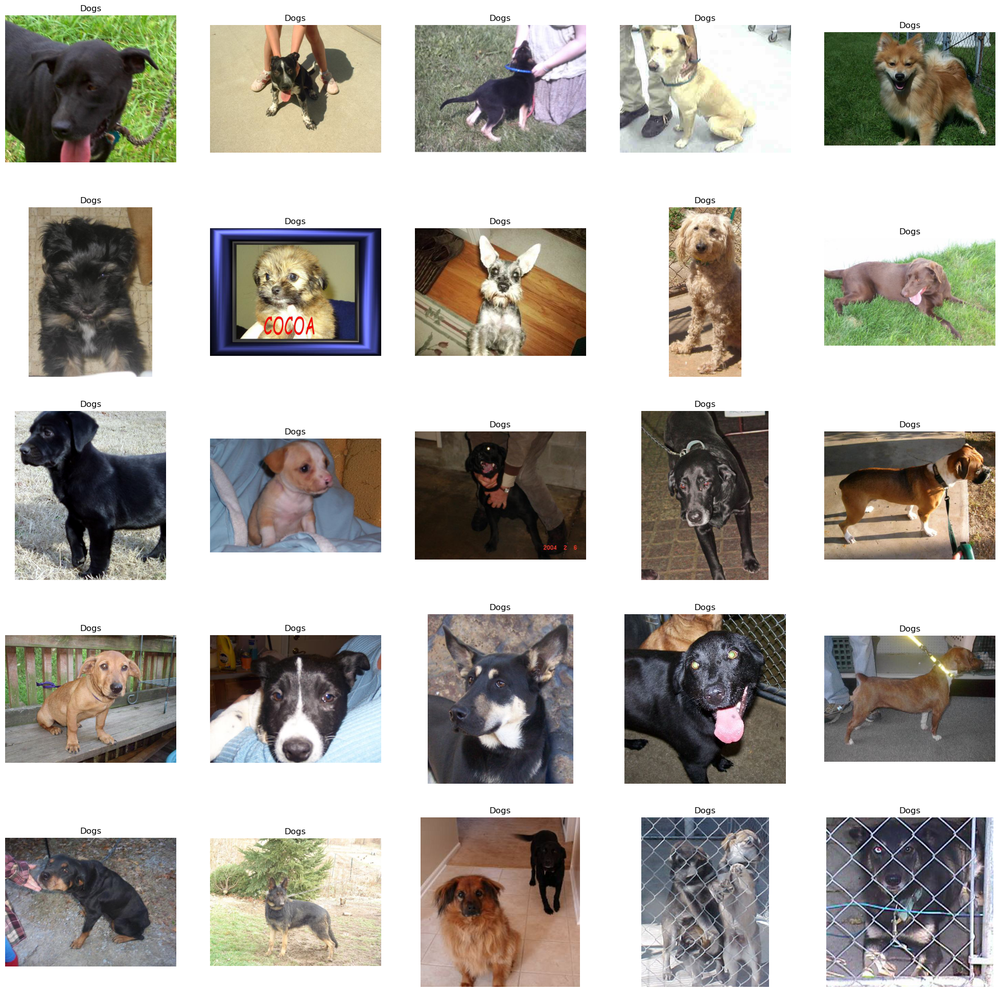

In [10]:
#for dogs
plt.figure(figsize = (25,25))
dogs = df[df['label']==1]['images'] #creates a dataframe of only images of dogs
start = random.randint(0, len(dogs))
files = dogs[start: start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img('kagglecatsanddogs_5340 (1)/'+ file)
    #turn image into array
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

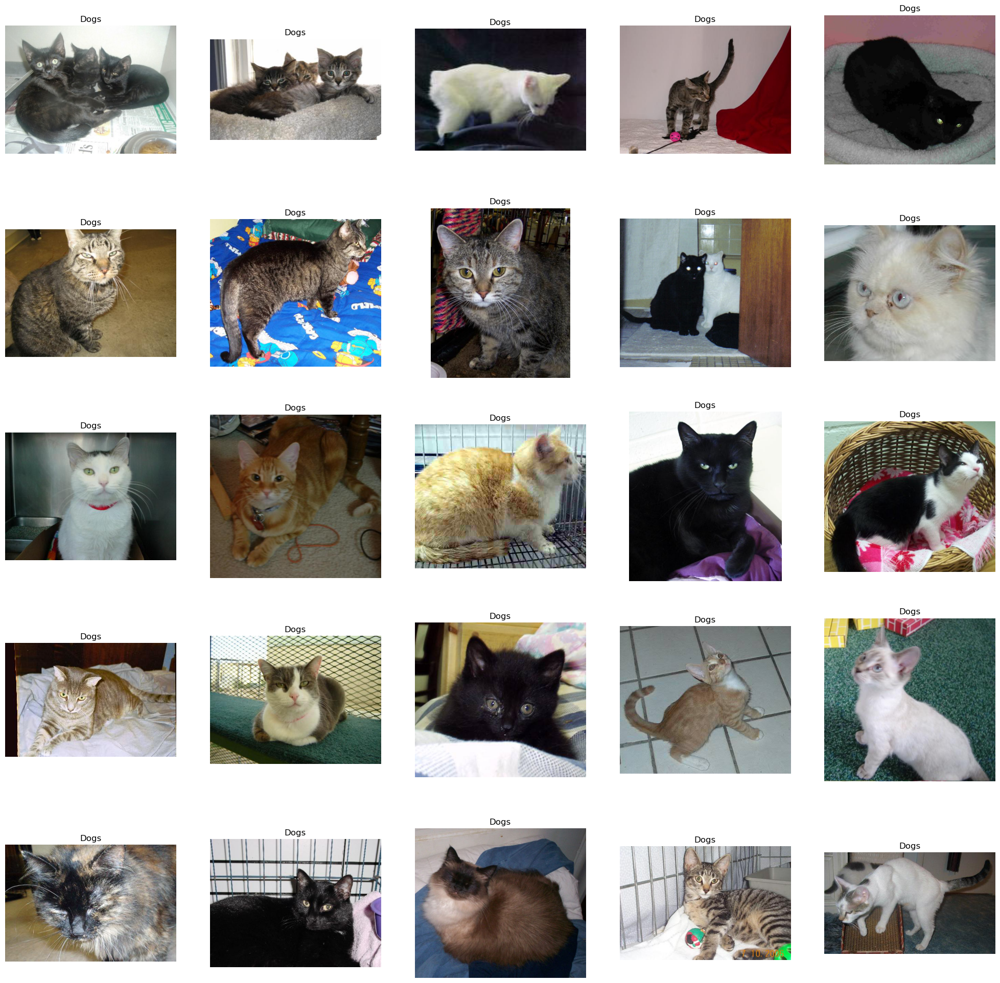

In [11]:
#for cats
plt.figure(figsize = (25,25))
cats = df[df['label']==0]['images'] #creates a dataframe of only images of dogs
start = random.randint(0, len(cats))
files = cats[start: start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img('kagglecatsanddogs_5340 (1)/'+ file)
    #turn image into array
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

In [12]:
print(df['label'].unique())


[0 1]


[0 1]


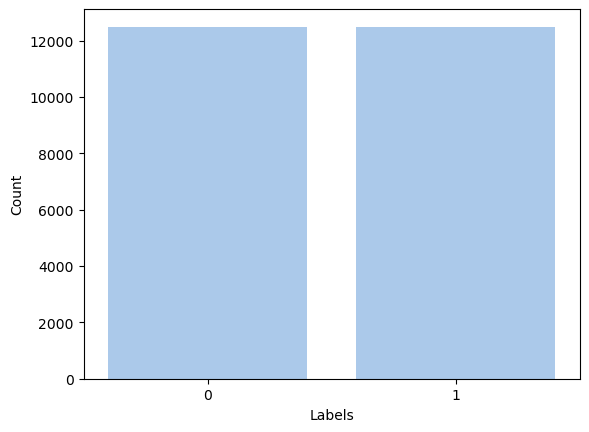

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

# Confirming the binary labels are the only values
print(df['label'].unique())  # Should print [1 0]
sns.set_palette("pastel")

# Plotting the binary label distribution
sns.countplot(x = 'label', data = df)
plt.xlabel('Labels')
plt.ylabel('Count')
plt.show()


Create Data Generator for the Images

- We cannot convert ALL images into numpy array because it will crash the system
- Directly read images from disk itself when it is needed (save space in ram)

ImageDataGenerator:

Data Augmentation: Automatically generates augmented images from your original dataset to help prevent overfitting and improve generalization. Transformations include rotation, width/height shifts, zoom, flips, and more.

Real-Time Processing: Applies transformations in real time while the model is being trained, which helps in managing memory usage efficiently since it doesn't require storing all augmented images on disk.

In [14]:
df['images'].head()

0     PetImages/Cat/1165.jpg
1     PetImages/Cat/6593.jpg
2     PetImages/Cat/1292.jpg
3    PetImages/Cat/11242.jpg
4    PetImages/Dog/12385.jpg
Name: images, dtype: object

In [15]:
df['label'] = df['label'].astype('str')
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24998 entries, 0 to 25001
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   images  24998 non-null  object
 1   label   24998 non-null  object
dtypes: object(2)
memory usage: 585.9+ KB


In [16]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#this is image augmentations
train_generator = ImageDataGenerator(
    rescale = 1./255, #normal images
    rotation_range = 40, #degree range for random rotations
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest' #fills the gone area when rotating etc with nearing pixel

)

#input split
from sklearn.model_selection import train_test_split
#2 variables for dataframe as a whole
train, test = train_test_split(df, test_size = 0.2, random_state = 42)
X_train, X_test,Y_train, Y_test = train_test_split(df['images'], df['label'] ,test_size = 0.2, random_state = 42)


train_iterator = train_generator.flow_from_dataframe(
    train,
    directory='kagglecatsanddogs_5340 (1)/',
    x_col = 'images', 
    y_col = 'label', 
    target_size =(128, 128), 
    batch_size = 512, 
    class_mode = 'binary'
    )

val_generator = ImageDataGenerator(rescale = 1./255)

val_iterator = val_generator.flow_from_dataframe(
    test,
    directory='kagglecatsanddogs_5340 (1)/',
    x_col = 'images', 
    y_col = 'label', 
    target_size =(128, 128), 
    batch_size = 512, 
    class_mode = 'binary'
    )

val_iterator


Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


In [17]:
train.head()

,images,label
23290,PetImages/Dog/1251.jpg,1
17784,PetImages/Dog/11365.jpg,1
1020,PetImages/Dog/1071.jpg,1
12647,PetImages/Cat/6431.jpg,0
1533,PetImages/Dog/6945.jpg,1


In [18]:
test.head()

,images,label
6870,PetImages/Dog/5260.jpg,1
22914,PetImages/Dog/10446.jpg,1
9671,PetImages/Cat/12379.jpg,0
13641,PetImages/Cat/3946.jpg,0
23341,PetImages/Dog/6922.jpg,1


Model Creation

In [19]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense
#Sequential means adds each layer in a sequential manner
model = Sequential([
    #In first layer need input shape
    #16 is number of filters
    Conv2D(16, kernel_size=(3,3), activation = 'relu', input_shape = (128, 128, 3)),
    MaxPool2D((2,2)),
    Conv2D(32, kernel_size=(3,3), activation = 'relu'),
    MaxPool2D((2,2)),
    Conv2D(64, kernel_size=(3,3), activation = 'relu'),
    #(2,2) is the kernel size
    MaxPool2D((2,2)),
    Flatten(), #1D array
    #512 represents number of neurons
    Dense(512, activation = 'relu'),
    Dense(1, activation = 'sigmoid') #multiple outputs = softmax

])

/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [20]:
model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'] )
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     6,423,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,447,137 (24.59 MB)

 Trainable params: 6,447,137 (24.59 MB)

 Non-trainable params: 0 (0.00 B)

In [21]:
history = model.fit(train_iterator, epochs = 5, validation_data = val_iterator)


Epoch 1/5


/opt/anaconda3/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/40 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - accuracy: 0.5146 - loss: 0.8515

/opt/anaconda3/lib/python3.12/site-packages/PIL/TiffImagePlugin.py:890: UserWarning: Truncated File Read
  warnings.warn(str(msg))


40/40 ━━━━━━━━━━━━━━━━━━━━ 73s 2s/step - accuracy: 0.5309 - loss: 0.7954 - val_accuracy: 0.6652 - val_loss: 0.6311
Epoch 2/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 77s 2s/step - accuracy: 0.6285 - loss: 0.6446 - val_accuracy: 0.6620 - val_loss: 0.6178
Epoch 3/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 75s 2s/step - accuracy: 0.6897 - loss: 0.5864 - val_accuracy: 0.7348 - val_loss: 0.5364
Epoch 4/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 73s 2s/step - accuracy: 0.7146 - loss: 0.5523 - val_accuracy: 0.7350 - val_loss: 0.5284
Epoch 5/5
20/40 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.7276 - loss: 0.5425

In [ ]:
loss, accuracy = model.evaluate(val_iterator)
print(f'Loss: {loss}')
print(f'Accuracy: {accuracy}')

10/10 ━━━━━━━━━━━━━━━━━━━━ 8s 754ms/step - accuracy: 0.7578 - loss: 0.4982
Loss: 0.5074216723442078
Accuracy: 0.7465999722480774


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     6,423,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,341,413 (73.78 MB)

 Trainable params: 6,447,137 (24.59 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 12,894,276 (49.19 MB)

Visualizing the Results

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.preprocessing import LabelEncoder

# Assuming Y_test contains string labels
label_encoder = LabelEncoder()
Y_test_numeric = label_encoder.fit_transform(Y_test)

# Process images
directory = '/Users/naomigong/Coding/ML Projects/catvsdog/kagglecatsanddogs_5340 (1)'
full_paths = [directory + '/' + img_path for img_path in X_test]

X_test_processed = np.array([img_to_array(load_img(img_path, target_size=(128, 128))) for img_path in full_paths])
X_test_processed = X_test_processed / 255.0  # Normalize pixel values

# Evaluate the model
loss, accuracy = model.evaluate(X_test_processed, Y_test_numeric)
print(f'Loss: {loss}')
print(f'Accuracy: {accuracy}')



157/157 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - accuracy: 0.7330 - loss: 0.5240
Loss: 0.507421612739563
Accuracy: 0.7465999722480774


In [ ]:
#for training
acc = history.history['accuracy']
val_acc= history.history['val_accuracy']
epochs = range(len(acc))
plt.plot(epochs, acc, 'b', label = 'Training Accuracy')
plt.plot(epochs, val_acc, 'r', label = 'Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, acc, 'b', label = 'Training Loss')
plt.plot(epochs, val_acc, 'r', label = 'Validation Loss')
plt.title('Loss Graph')
plt.legend()

NameError: name 'history' is not defined